<p style="text-align:center">
    <a href="https://skills.network" target="_blank">
    <img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/assets/logos/SN_web_lightmode.png" width="200" alt="Skills Network Logo"  />
    </a>
</p>


# **Data Visualization - Bubble Plots**


### Student Author: Abigail Hedden
I chose to create bubble plots using plotly and seaborn

## Objectives


-   Visualize the distribution of data.

-   Visualize the relationship between two data features.

-   Visualize composition of data.

-   Visualize comparison of data.


## Set-up: 

In [1]:
# install required libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

### Plotting style

In [2]:
# set plot theme
sns.set_theme(style="whitegrid")

### Download database

In [3]:
!wget -O survey-data.csv https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv

--2025-07-14 17:39:24--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 169.63.118.104
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|169.63.118.104|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 159525875 (152M) [text/csv]
Saving to: ‘survey-data.csv’

survey-data.csv     100%[===================>] 152.13M  4.96MB/s    in 21s     

2025-07-14 17:39:45 (7.34 MB/s) - ‘survey-data.csv’ saved [159525875/159525875]



,ResponseId,MainBranch,Age,Employment,RemoteWork,Check,CodingActivities,EdLevel,LearnCode,LearnCodeOnline,...,JobSatPoints_6,JobSatPoints_7,JobSatPoints_8,JobSatPoints_9,JobSatPoints_10,JobSatPoints_11,SurveyLength,SurveyEase,ConvertedCompYearly,JobSat
0,1,I am a developer by profession,Under 18 years old,"Employed, full-time",Remote,Apples,Hobby,Primary/elementary school,Books / Physical media,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,I am a developer by profession,35-44 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
2,3,I am a developer by profession,45-54 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,...,NaN,NaN,NaN,NaN,NaN,NaN,Appropriate in length,Easy,NaN,NaN
3,4,I am learning to code,18-24 years old,"Student, full-time",NaN,Apples,NaN,Some college/university study without earning ...,"Other online resources (e.g., videos, blogs, f...",Stack Overflow;How-to videos;Interactive tutorial,...,NaN,NaN,NaN,NaN,NaN,NaN,Too long,Easy,NaN,NaN
4,5,I am a developer by profession,18-24 years old,"Student, full-time",NaN,Apples,NaN,"Secondary school (e.g. American high school, G...","Other online resources (e.g., videos, blogs, f...",Technical documentation;Blogs;Written Tutorial...,...,NaN,NaN,NaN,NaN,NaN,NaN,Too short,Easy,NaN,NaN


In [24]:
df = pd.read_csv("survey-data.csv")

df.head()

,ResponseId,MainBranch,Age,Employment,RemoteWork,Check,CodingActivities,EdLevel,LearnCode,LearnCodeOnline,...,JobSatPoints_6,JobSatPoints_7,JobSatPoints_8,JobSatPoints_9,JobSatPoints_10,JobSatPoints_11,SurveyLength,SurveyEase,ConvertedCompYearly,JobSat
0,1,I am a developer by profession,Under 18 years old,"Employed, full-time",Remote,Apples,Hobby,Primary/elementary school,Books / Physical media,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,I am a developer by profession,35-44 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
2,3,I am a developer by profession,45-54 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,...,NaN,NaN,NaN,NaN,NaN,NaN,Appropriate in length,Easy,NaN,NaN
3,4,I am learning to code,18-24 years old,"Student, full-time",NaN,Apples,NaN,Some college/university study without earning ...,"Other online resources (e.g., videos, blogs, f...",Stack Overflow;How-to videos;Interactive tutorial,...,NaN,NaN,NaN,NaN,NaN,NaN,Too long,Easy,NaN,NaN
4,5,I am a developer by profession,18-24 years old,"Student, full-time",NaN,Apples,NaN,"Secondary school (e.g. American high school, G...","Other online resources (e.g., videos, blogs, f...",Technical documentation;Blogs;Written Tutorial...,...,NaN,NaN,NaN,NaN,NaN,NaN,Too short,Easy,NaN,NaN


## Clean data for scatterplots
Some columns are not numeric and therefore proper for scatterplots. I am updating those first.

In [27]:
# update age
# map age groups to numeric values -- use midpoint of age group
age_map = {
    "Under 18 years old": 16,
    "18-24 years old": 21,
    "25-34 years old": 29.5,
    "35-44 years old": 39.5,
    "45-54 years old": 49.5,
    "55-64 years old": 59.5,
    "65 years or older": 70
}

df['AgeNumeric'] = df['Age'].map(age_map)

In [28]:
# remove ConvertedCompYearly outliers
print(df.ConvertedCompYearly.describe())
df_comp_lim = df[df['ConvertedCompYearly']<1000000]

count    2.343500e+04
mean     8.615529e+04
std      1.867570e+05
min      1.000000e+00
25%      3.271200e+04
50%      6.500000e+04
75%      1.079715e+05
max      1.625660e+07
Name: ConvertedCompYearly, dtype: float64


### Bubble Plot for Age vs. Frequency of Participation


- Visualize the relationship between respondents’ age and their participation frequency (`SOPartFreq`) using a bubble plot.

- Use the size of the bubbles to represent their job satisfaction (`JobSat`).


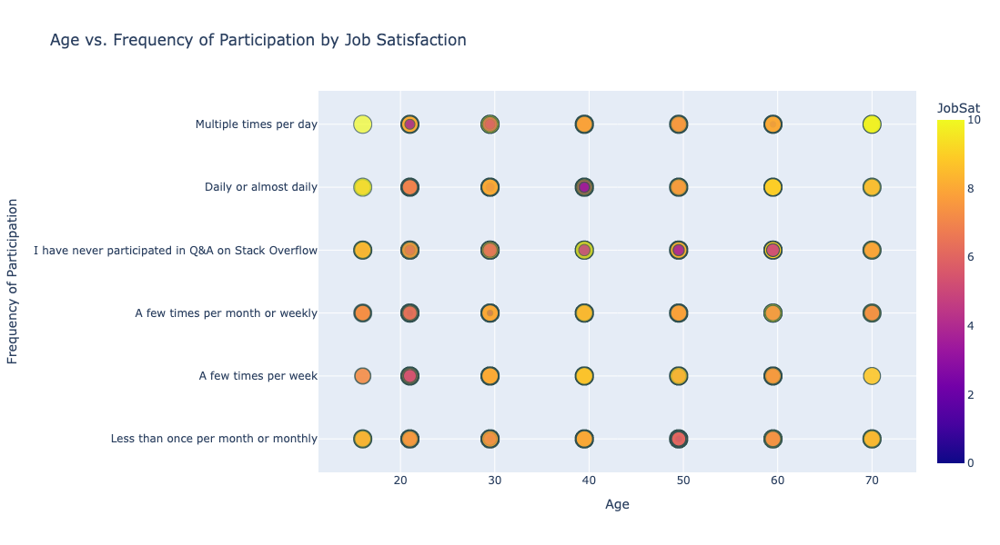

In [29]:
# using plotly 

# drop rows where size variable is NaN
filtered_df = df.dropna(subset=["AgeNumeric", "SOPartFreq", "JobSat"])

fig = px.scatter(
    filtered_df,
    x="AgeNumeric",
    y="SOPartFreq",
    size="JobSat",
    color="JobSat",
    hover_data=["AgeNumeric", "SOPartFreq", "JobSat"],
    title="Age vs. Frequency of Participation by Job Satisfaction",
    height=600,
)

fig.update_traces(
    marker=dict(sizemode='area', opacity=0.7, line=dict(width=1, color='DarkSlateGrey'))
)

fig.update_layout(
    xaxis_title="Age",
    yaxis_title="Frequency of Participation",
    legend_title="Job Satisfaction"
)

fig.show()

### Bubble Plot for Compensation vs. Job Satisfaction


- Visualize the relationship between yearly compensation (`ConvertedCompYearly`) and job satisfaction (`JobSat`).

- Use the size of the bubbles to represent respondents’ age.


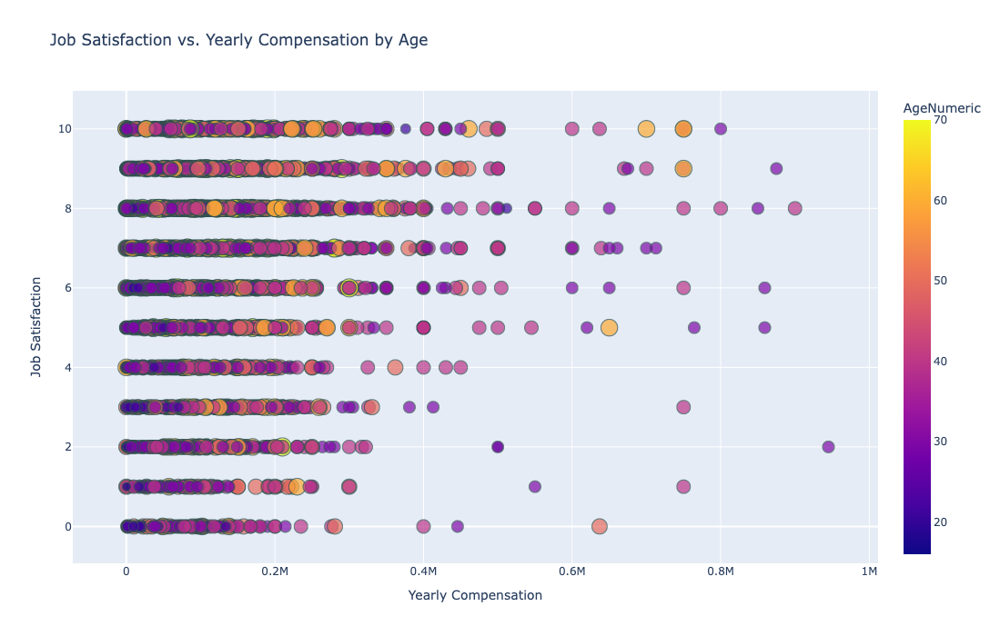

In [30]:
# using plotly 

# drop rows where size variable is NaN
filtered_comp_df = df_comp_lim.dropna(subset=["ConvertedCompYearly", "JobSat", "AgeNumeric"])

fig = px.scatter(
    filtered_comp_df,
    x="ConvertedCompYearly",
    y="JobSat",
    size="AgeNumeric",
    color="AgeNumeric",
    hover_data=["ConvertedCompYearly", "JobSat", "AgeNumeric"],
    title="Job Satisfaction vs. Yearly Compensation by Age",
    height=700,
)

fig.update_traces(
    marker=dict(sizemode='area', opacity=0.7, line=dict(width=1, color='DarkSlateGrey'))
)

fig.update_layout(
    xaxis_title="Yearly Compensation",
    yaxis_title="Job Satisfaction",
    legend_title="Age"
)

fig.show()

### Bubble Plot of Technology Preferences by Age

- Visualize the popularity of programming languages respondents have worked with (`LanguageHaveWorkedWith`) across age groups.

- Use bubble size to represent the frequency of each language.



In [45]:
# prep the data for plotting

# split the semicolon-separated string into lists
df["LanguageHaveWorkedWith"] = df["LanguageHaveWorkedWith"].apply(
    lambda x: x.split(";") if isinstance(x, str) else x
)

# explode each language into its own row
df_exploded = df.explode("LanguageHaveWorkedWith")

df_exploded["LanguageHaveWorkedWith"] = df_exploded["LanguageHaveWorkedWith"].str.strip()

# count frequency of each language for each age group
lang_counts = (df_exploded.groupby(["AgeNumeric", "LanguageHaveWorkedWith"]).size().reset_index(name="Frequency"))

# drop nans
plot_df = lang_counts.dropna(subset=["AgeNumeric", "LanguageHaveWorkedWith", "Frequency"])

plot_df.head(10)

,AgeNumeric,LanguageHaveWorkedWith,Frequency
0,16.0,Ada,25
1,16.0,Apex,7
2,16.0,Assembly,242
3,16.0,Bash/Shell (all shells),746
4,16.0,C,746
5,16.0,C#,650
6,16.0,C++,902
7,16.0,Clojure,13
8,16.0,Cobol,8
9,16.0,Crystal,9


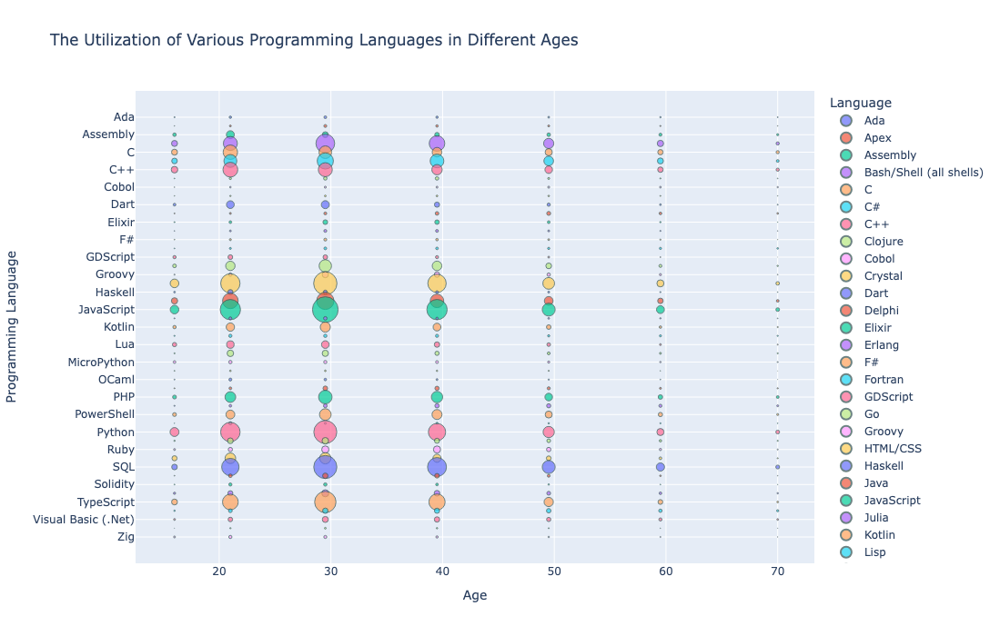

In [41]:
# using plotly 

fig = px.scatter(
    plot_df,
    x="AgeNumeric",
    y="LanguageHaveWorkedWith",
    size="Frequency",
    color="LanguageHaveWorkedWith",
    hover_data=["AgeNumeric", "LanguageHaveWorkedWith", "Frequency"],
    title="The Utilization of Various Programming Languages in Different Ages",
    height=700,
)

fig.update_traces(
    marker=dict(sizemode='area', opacity=0.7, line=dict(width=1, color='DarkSlateGrey'))
)

fig.update_layout(
    xaxis_title="Age",
    yaxis_title="Programming Language",
    legend_title="Language"
)

fig.show()

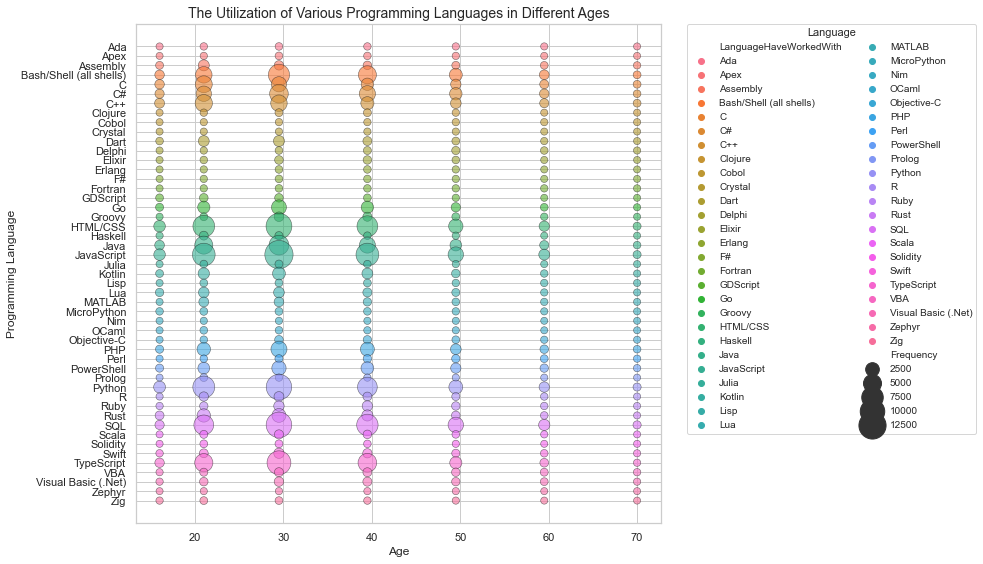

In [43]:
plt.figure(figsize=(14, 8))

sns.scatterplot(
    data=plot_df,
    x="AgeNumeric",
    y="LanguageHaveWorkedWith",
    size="Frequency",
    sizes=(50, 800),
    hue="LanguageHaveWorkedWith",
    alpha=0.6,
    edgecolor="k"
)

plt.legend(
    title='Language',
    bbox_to_anchor=(1.05, 1),
    loc='upper left',
    borderaxespad=0.,
    ncol=2,# wrap columns to 2 cols
    fontsize=10,
    title_fontsize=11
)

plt.title("The Utilization of Various Programming Languages in Different Ages", fontsize=14)
plt.xlabel("Age")
plt.ylabel("Programming Language")
plt.tight_layout()

plt.show()

### Bubble Plot for Preferred Databases vs. Job Satisfaction

- Explore the relationship between preferred databases (`DatabaseWantToWorkWith`) and job satisfaction.

- Use bubble size to indicate the number of respondents for each database.


In [49]:
# prep the data for plotting

# split the semicolon-separated string into lists
df["DatabaseWantToWorkWith"] = df["DatabaseWantToWorkWith"].apply(
    lambda x: x.split(";") if isinstance(x, str) else x
)

# explode each language into its own row
df_exploded2 = df.explode("DatabaseWantToWorkWith")

df_exploded2["DatabaseWantToWorkWith"] = df_exploded2["DatabaseWantToWorkWith"].str.strip()

# count frequency of each language for each age group
db_counts = (df_exploded2.groupby(["JobSat", "DatabaseWantToWorkWith"]).size().reset_index(name="Frequency"))

# drop nans
plot_df2 = db_counts.dropna(subset=["JobSat", "DatabaseWantToWorkWith", "Frequency"])

plot_df2.head(10)

,JobSat,DatabaseWantToWorkWith,Frequency
0,0.0,BigQuery,15
1,0.0,Cassandra,23
2,0.0,Clickhouse,8
3,0.0,Cloud Firestore,6
4,0.0,Cockroachdb,8
5,0.0,Cosmos DB,14
6,0.0,Couch DB,5
7,0.0,Couchbase,2
8,0.0,Databricks SQL,15
9,0.0,Datomic,1


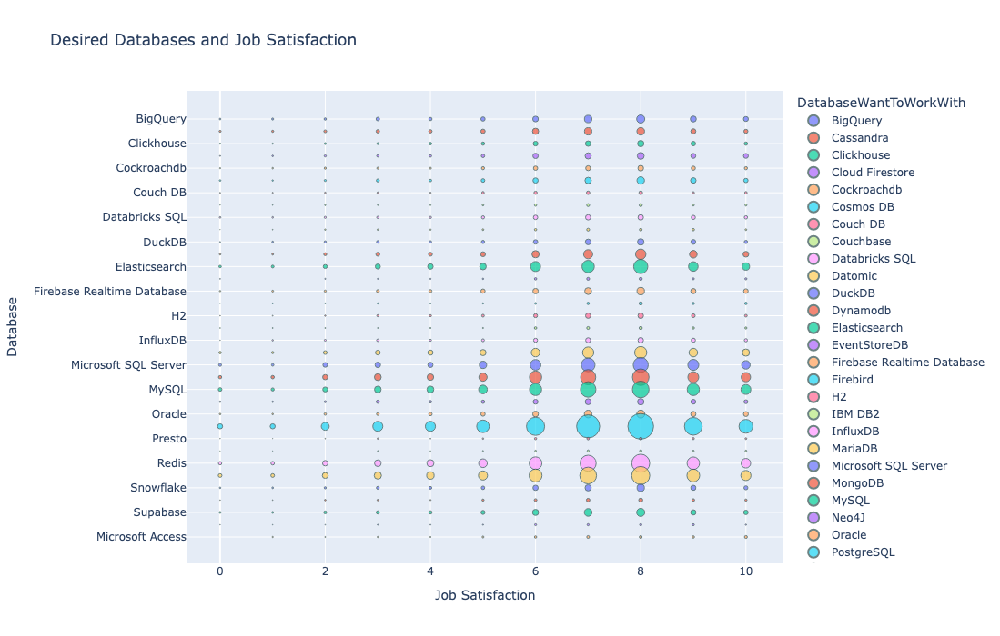

In [53]:
# using plotly 

fig = px.scatter(
    plot_df2,
    x="JobSat",
    y="DatabaseWantToWorkWith",
    size="Frequency",
    color="DatabaseWantToWorkWith",
    hover_data=["JobSat", "DatabaseWantToWorkWith", "Frequency"],
    title="Desired Databases and Job Satisfaction",
    height=700,
)

fig.update_traces(
    marker=dict(sizemode='area', opacity=0.7, line=dict(width=1, color='DarkSlateGrey'))
)

fig.update_layout(
    xaxis_title="Job Satisfaction",
    yaxis_title="Database")

fig.show()

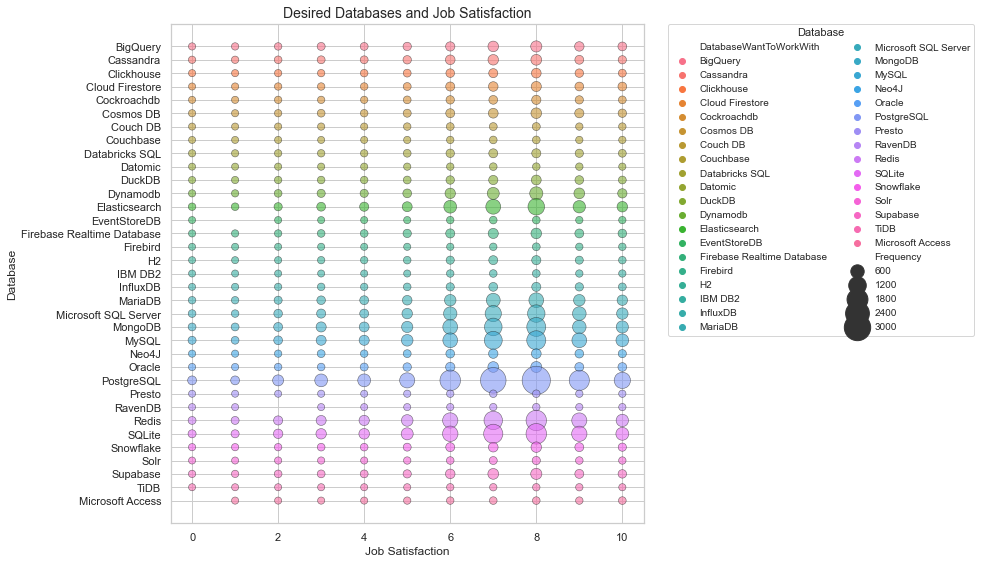

In [51]:
plt.figure(figsize=(14, 8))

sns.scatterplot(
    data=plot_df2,
    x="JobSat",
    y="DatabaseWantToWorkWith",
    size="Frequency",
    sizes=(50, 800),
    hue="DatabaseWantToWorkWith",
    alpha=0.6,
    edgecolor="k"
)

plt.legend(
    title='Database',
    bbox_to_anchor=(1.05, 1),
    loc='upper left',
    borderaxespad=0.,
    ncol=2,# wrap columns to 2 cols
    fontsize=10,
    title_fontsize=11
)

plt.title("Desired Databases and Job Satisfaction", fontsize=14)
plt.xlabel("Job Satisfaction")
plt.ylabel("Database")
plt.tight_layout()

plt.show()

### Bubble Plot for Compensation Across Developer Roles

- Visualize compensation (`ConvertedCompYearly`) across different developer roles (`DevType`).

- Use bubble size to represent job satisfaction.


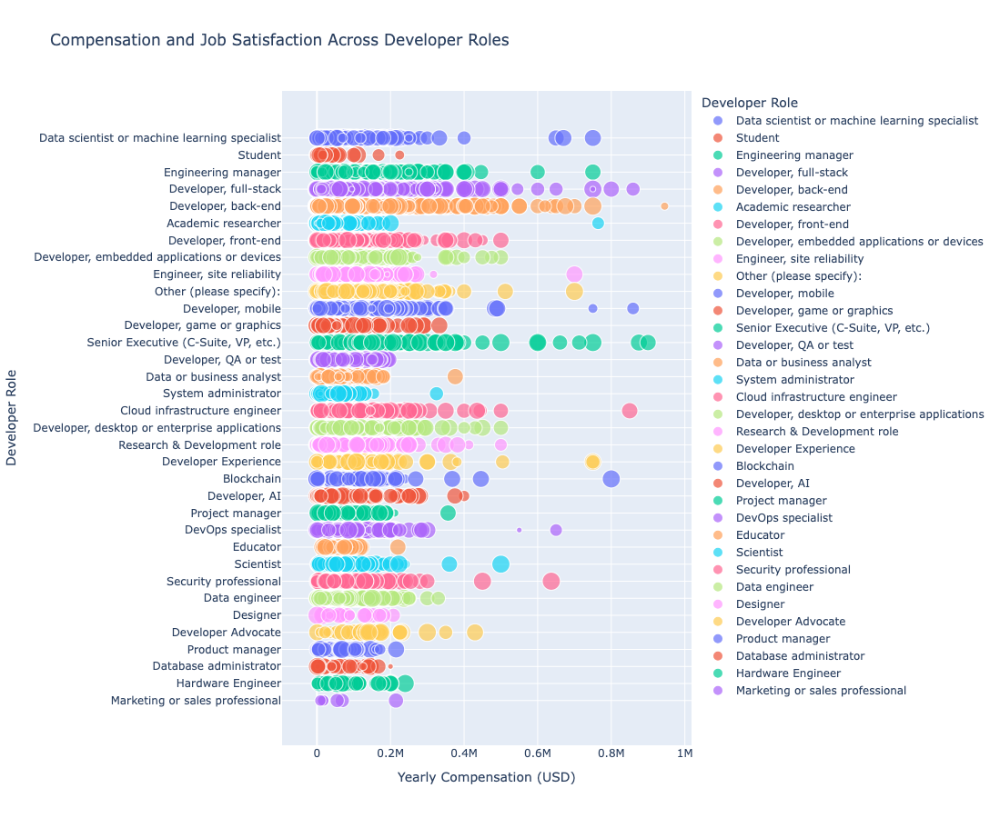

In [61]:
plot_data = df_comp_lim.dropna(subset=["DevType", "ConvertedCompYearly", "JobSat"])

fig = px.scatter(
    plot_data,
    x="ConvertedCompYearly",
    y="DevType",
    size="JobSat",
    color="DevType",
    hover_data=["DevType", "JobSat", "ConvertedCompYearly"],
    title="Compensation and Job Satisfaction Across Developer Roles",
    height=900
)

fig.update_layout(
    yaxis_title="Developer Role",
    xaxis_title="Yearly Compensation (USD)",
    legend_title="Developer Role",
)


fig.show()


### Bubble Plot for Collaboration Tools by Age

- Visualize the relationship between the collaboration tools used (`NEWCollabToolsHaveWorkedWith`) and age groups.

- Use bubble size to represent the frequency of tool usage.


In [66]:
# prep the data for plotting

# split the semicolon-separated string into lists
df["NEWCollabToolsHaveWorkedWith"] = df["NEWCollabToolsHaveWorkedWith"].apply(
    lambda x: x.split(";") if isinstance(x, str) else x
)

# explode each language into its own row
df_exploded3 = df.explode("NEWCollabToolsHaveWorkedWith")

df_exploded3["NEWCollabToolsHaveWorkedWith"] = df_exploded3["NEWCollabToolsHaveWorkedWith"].str.strip()

# count frequency of each language for each age group
tool_counts = (df_exploded3.groupby(["Age", "NEWCollabToolsHaveWorkedWith"]).size().reset_index(name="Frequency"))

# drop nans
plot_df3 = tool_counts.dropna(subset=["Age", "NEWCollabToolsHaveWorkedWith", "Frequency"])
plot_df3["Age"] = plot_df3["Age"].str.strip()

plot_df3.head(10)

,Age,NEWCollabToolsHaveWorkedWith,Frequency
0,18-24 years old,Android Studio,2663
1,18-24 years old,BBEdit,35
2,18-24 years old,CLion,1168
3,18-24 years old,Code::Blocks,531
4,18-24 years old,DataGrip,709
5,18-24 years old,Eclipse,1244
6,18-24 years old,Emacs,414
7,18-24 years old,Fleet,313
8,18-24 years old,Geany,95
9,18-24 years old,Goland,395


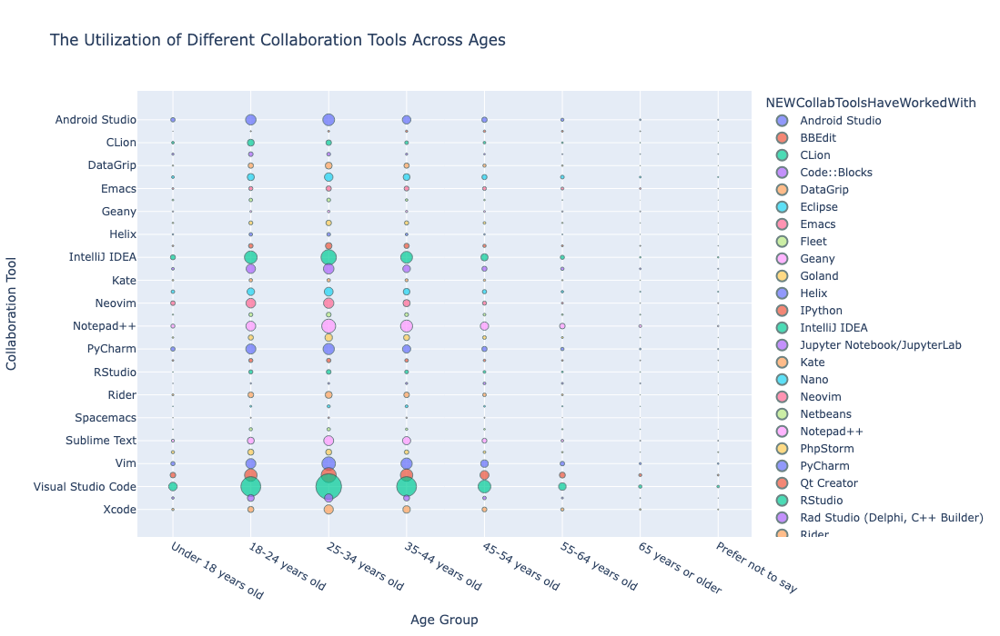

In [68]:
# using plotly 

fig = px.scatter(
    plot_df3,
    x="Age",
    y="NEWCollabToolsHaveWorkedWith",
    size="Frequency",
    color="NEWCollabToolsHaveWorkedWith",
    hover_data=["Age", "NEWCollabToolsHaveWorkedWith", "Frequency"],
    title="The Utilization of Different Collaboration Tools Across Ages",
    height=700,
)

fig.update_traces(
    marker=dict(sizemode='area', opacity=0.7, line=dict(width=1, color='DarkSlateGrey'))
)

# set order for x-axis
desired_age_order = [
    "Under 18 years old",
    "18-24 years old",
    "25-34 years old",
    "35-44 years old",
    "45-54 years old",
    "55-64 years old",
    "65 years or older",
    "Prefer not to say"
]
fig.update_xaxes(
    categoryorder="array",
    categoryarray=desired_age_order
)

fig.update_layout(
    xaxis_title="Age Group",
    yaxis_title="Collaboration Tool")

fig.show()

### Bubble Plot for Preferred Web Frameworks vs. Job Satisfaction

- Explore the relationship between preferred web frameworks (`WebframeWantToWorkWith`) and job satisfaction.

- Use bubble size to represent the number of respondents.



In [71]:
# prep the data for plotting

# split the semicolon-separated string into lists
df["WebframeWantToWorkWith"] = df["WebframeWantToWorkWith"].apply(
    lambda x: x.split(";") if isinstance(x, str) else x
)

# explode each language into its own row
df_exploded4 = df.explode("WebframeWantToWorkWith")

df_exploded4["WebframeWantToWorkWith"] = df_exploded4["WebframeWantToWorkWith"].str.strip()

# count frequency of each language for each age group
webframe_counts = (df_exploded4.groupby(["JobSat", "WebframeWantToWorkWith"]).size().reset_index(name="Frequency"))

# drop nans
plot_df4 = webframe_counts.dropna(subset=["JobSat", "WebframeWantToWorkWith", "Frequency"])

plot_df4.head(10)

,JobSat,WebframeWantToWorkWith,Frequency
0,0.0,ASP.NET,20
1,0.0,ASP.NET CORE,39
2,0.0,Angular,25
3,0.0,AngularJS,7
4,0.0,Astro,13
5,0.0,Blazor,17
6,0.0,CodeIgniter,1
7,0.0,Deno,11
8,0.0,Django,39
9,0.0,Drupal,4


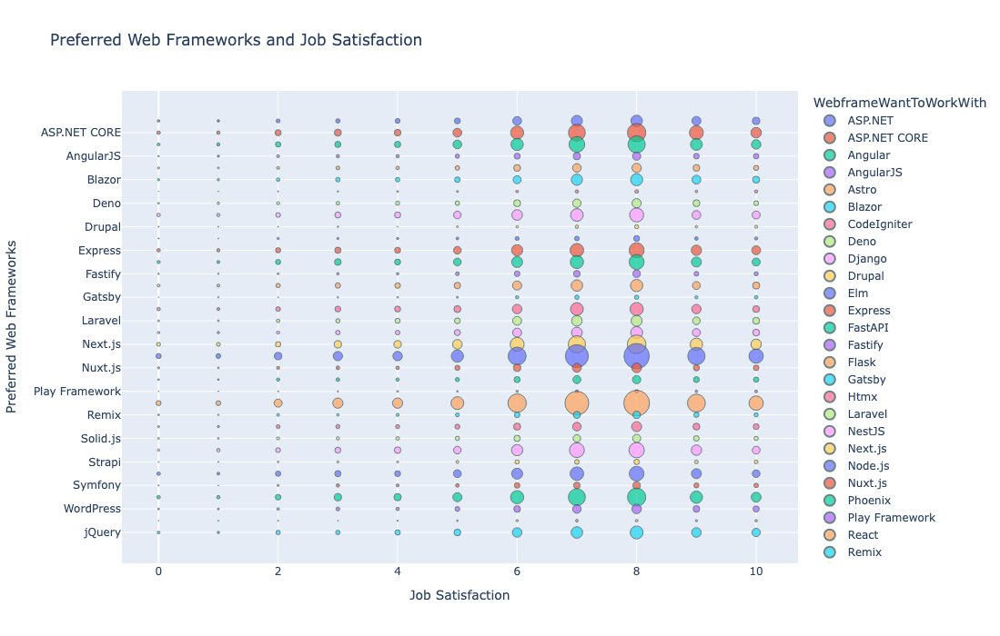

In [74]:
# using plotly 

fig = px.scatter(
    plot_df4,
    x="JobSat",
    y="WebframeWantToWorkWith",
    size="Frequency",
    color="WebframeWantToWorkWith",
    hover_data=["JobSat", "WebframeWantToWorkWith", "Frequency"],
    title="Preferred Web Frameworks and Job Satisfaction",
    height=700,
)

fig.update_traces(
    marker=dict(sizemode='area', opacity=0.7, line=dict(width=1, color='DarkSlateGrey'))
)

fig.update_layout(
    xaxis_title="Job Satisfaction",
    yaxis_title="Preferred Web Frameworks")

fig.show()

### Bubble Plot for Admired Technologies Across Countries

- Visualize the distribution of admired technologies (`LanguageAdmired`) across different countries (`Country`).

- Use bubble size to represent the frequency of admiration.



In [78]:
# prep the data for plotting

# split the semicolon-separated string into lists
df["LanguageAdmired"] = df["LanguageAdmired"].apply(
    lambda x: x.split(";") if isinstance(x, str) else x
)

# explode each language into its own row
df_exploded5 = df.explode("LanguageAdmired")

df_exploded5["LanguageAdmired"] = df_exploded5["LanguageAdmired"].str.strip()

# count frequency of each language for each age group
adm_tech_counts = (df_exploded5.groupby(["Country", "LanguageAdmired"]).size().reset_index(name="Frequency"))

# drop nans
plot_df5 = adm_tech_counts.dropna(subset=["Country", "LanguageAdmired", "Frequency"])

plot_df5.head(10)

,Country,LanguageAdmired,Frequency
0,Afghanistan,Ada,7
1,Afghanistan,Apex,3
2,Afghanistan,Assembly,5
3,Afghanistan,Bash/Shell (all shells),10
4,Afghanistan,C,6
5,Afghanistan,C#,6
6,Afghanistan,C++,10
7,Afghanistan,Clojure,3
8,Afghanistan,Cobol,2
9,Afghanistan,Crystal,4


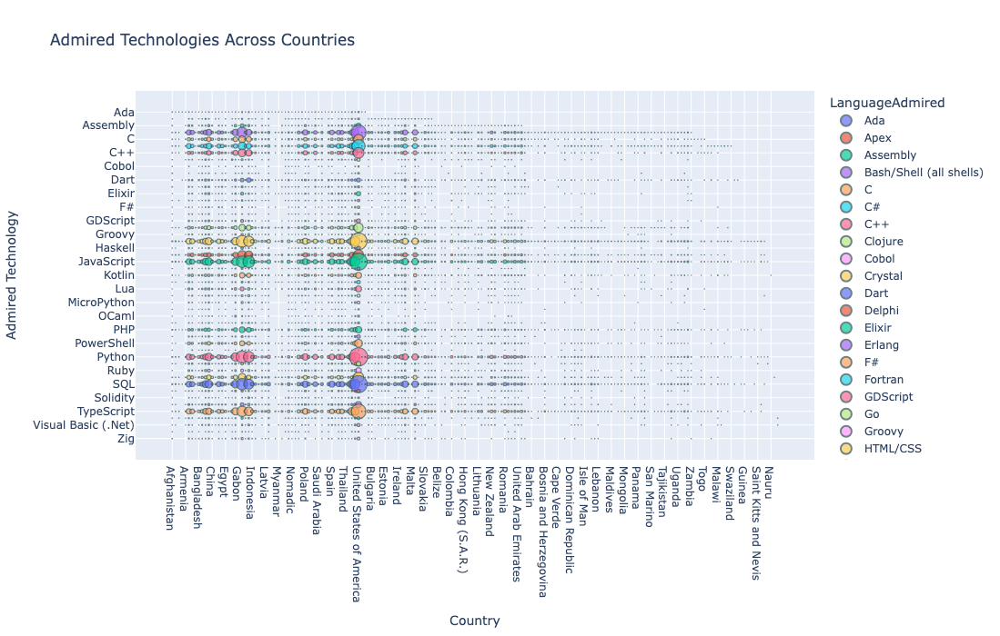

In [83]:
# using plotly 

fig = px.scatter(
    plot_df5,
    x="Country",
    y="LanguageAdmired",
    size="Frequency",
    color="LanguageAdmired",
    hover_data=["Country", "LanguageAdmired", "Frequency"],
    title="Admired Technologies Across Countries",
    height=700,
    width=2500
)

fig.update_traces(
    marker=dict(sizemode='area', opacity=0.7, line=dict(width=1, color='DarkSlateGrey'))
)

fig.update_layout(
    xaxis_title="Country",
    yaxis_title="Admired Technology")

fig.show()

## Authors:
Ayushi Jain


### Other Contributors:
- Rav Ahuja
- Lakshmi Holla
- Malika


<!--
## Change Log
|Date (YYYY-MM-DD)|Version|Changed By|Change Description|
|-|-|-|-|
|2024-10-29|1.2|Madhusudhan Moole|Updated lab|
|2024-10-16|1.1|Madhusudhan Moole|Updated lab|
|2024-10-15|1.0|Raghul Ramesh|Created lab|
--!>


Copyright © IBM Corporation. All rights reserved.
